In [1]:
%matplotlib inline
import pandas as pd
import datetime
import pandas_datareader.data as web
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np

/home/ivlabs/anaconda3/envs/akshay/lib/python3.7/site-packages/numpy/lib/arraysetops.py:522: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


                  class     x_acc      y_acc        z_acc
time                                                     
49105962326000  Jogging -0.694638  12.680544   0.50395286
49106062271000  Jogging  5.012288  11.264028   0.95342433
49106112167000  Jogging  4.903325  10.882658  -0.08172209
49106222305000  Jogging -0.612916  18.496431    3.0237172
49106332290000  Jogging -1.184970  12.108489     7.205164


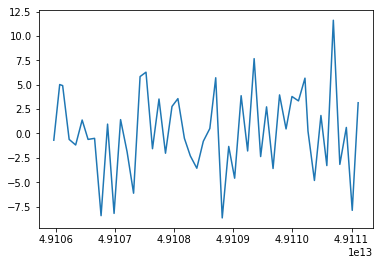

In [10]:
df = pd.read_csv('/home/ivlabs/users/akshay/WISDM_ar_v1.1/WISDM_ar_v1.1_raw.txt', index_col = 2, names = ['user', 'class', 'time', 'x_acc', 'y_acc', 'z_acc'])
df = df.drop('user', axis = 1)
df['z_acc'] = df['z_acc'].str.rstrip(';')
print(df.head())
plt.plot(df['x_acc'][ : 50])
df.to_csv('cleaned_data.csv')

In [42]:
df = pd.read_csv('/home/ivlabs/users/akshay/testing/cleaned_data.csv', header = 0, index_col = 0)
labels = pd.DataFrame(pd.get_dummies(df['class'], prefix='label'))
df = df.drop('class', axis = 1)
print(df.head())
print(labels.head())
dataframe = pd.concat([df, labels], axis = 1).drop_duplicates().reset_index(drop = False)
print(dataframe.head())
dataframe.to_csv('final_data.csv', index = None)

/home/ivlabs/anaconda3/envs/akshay/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
/home/ivlabs/anaconda3/envs/akshay/lib/python3.7/site-packages/numpy/lib/arraysetops.py:522: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


                   x_acc      y_acc      z_acc
time                                          
49105962326000 -0.694638  12.680544   0.503953
49106062271000  5.012288  11.264028   0.953424
49106112167000  4.903325  10.882658 -0.0817221
49106222305000 -0.612916  18.496431    3.02372
49106332290000 -1.184970  12.108489    7.20516
                label_Downstairs  label_Jogging  label_Sitting  \
time                                                             
49105962326000                 0              1              0   
49106062271000                 0              1              0   
49106112167000                 0              1              0   
49106222305000                 0              1              0   
49106332290000                 0              1              0   

                label_Standing  label_Upstairs  label_Walking  
time                                                           
49105962326000               0               0              0  
49106062271000  

In [2]:
final = pd.read_csv('final_data.csv', header = 0, index_col = 0)
print(final.head())
print(final.shape)

                   x_acc      y_acc      z_acc  label_Downstairs  \
time                                                               
49105962326000 -0.694638  12.680544   0.503953                 0   
49106062271000  5.012288  11.264028   0.953424                 0   
49106112167000  4.903325  10.882658 -0.0817221                 0   
49106222305000 -0.612916  18.496431    3.02372                 0   
49106332290000 -1.184970  12.108489    7.20516                 0   

                label_Jogging  label_Sitting  label_Standing  label_Upstairs  \
time                                                                           
49105962326000              1              0               0               0   
49106062271000              1              0               0               0   
49106112167000              1              0               0               0   
49106222305000              1              0               0               0   
49106332290000              1              

/home/ivlabs/anaconda3/envs/akshay/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [2]:
class IMUDataset(Dataset):
    def __init__(self, csv_file, transform = None):
        self.df = pd.read_csv(csv_file, header = 0, index_col = 0)
        self.transform = transform
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        if idx % 100 == 0 :
            y = self.df.iloc[idx : idx + 100, 3 : ].values
            ind = np.argmax(np.sum(y, axis = 0))
            label = np.zeros_like(self.df.iloc[0, 3 : ].values)
            label[ind] = 1
            x = self.df.iloc[idx : idx + 100, : 3].values
            return x, label
#         else :
#             continue

In [3]:
dataset = IMUDataset(csv_file = 'final_data.csv')
for i in range(len(dataset) // 100):
    x, label = dataset[i * 100]
    print(x, label)

/home/ivlabs/anaconda3/envs/akshay/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3185: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  if (yield from self.run_code(code, result)):


[[-0.6946376999999999 12.680544 0.50395286]
 [5.012288 11.264028 0.95342433]
 [4.903325 10.882658000000001 -0.08172209]
 [-0.61291564 18.496431 3.0237172]
 [-1.1849703 12.108489 7.205164]
 [1.3756552 -2.4925237 -6.5105260000000005]
 [-0.61291564 10.56939 5.706926]
 [-0.50395286 13.947235999999998 7.055340299999999]
 [-8.430995 11.413852 5.134871]
 [0.95342433 1.3756552 1.6480621]
 [-8.19945 19.57244 2.7240696]
 [1.4165162 5.7886477 2.982856]
 [-1.8796080000000002 -2.982856 -0.29964766]
 [-6.1291566 6.851035 -8.158588]
 [5.829509 18.0061 8.539958]
 [6.2789803 2.982856 2.9147544]
 [-1.56634 8.308413 -1.4573771999999998]
 [3.5276701 13.593107 9.425281]
 [-2.0294318 -5.706926 -10.18802]
 [2.7649305 10.337844 -9.724928]
 [3.5685309999999997 13.674829500000001 1.5390993]
 [-0.50395286 3.8681788 3.718355]
 [-2.3018389 1.6889231 0.08172209]
 [-3.5685309999999997 19.57244 6.5105260000000005]
 [-0.8036005 -3.2961242 -4.630918]
 [0.50395286 10.841797 13.525004999999998]
 [5.706926 15.595298000000

 [5.83 10.04 0.23154591]] [0 0 0 0 0 1]
[[5.05 6.74 -1.56634]
 [1.18 8.2 -1.56634]
 [0.04 9.72 1.879608]
 [1.12 10.27 0.23154591]
 [7.08 11.73 -1.8387469]
 [6.7 12.57 -0.19068487]
 [6.36 12.76 8.049625]
 [-3.26 17.77 -4.630918]
 [1.27 17.54 3.5276701]
 [2.07 7.31 -2.7513103]
 [-2.75 3.64 -1.6889231]
 [-4.37 3.3 -2.2609777]
 [-1.27 2.34 0.08172209]
 [9.77 6.17 6.782933]
 [16.59 18.54 11.073342]
 [3.53 3.11 0.7218784]
 [0.72 16.21 2.1792557]
 [-5.67 7.55 -4.5219555]
 [-2.79 11.84 -5.012288]
 [2.41 13.18 -2.9147544]
 [6.21 8.39 1.5390993]
 [3.95 6.28 -1.879608]
 [0.72 8.77 -1.525479]
 [0.23 10.12 2.5606253]
 [3.26 10.31 0.14982383]
 [8.96 11.03 -2.2201166000000003]
 [5.48 14.1 2.4925237]
 [8.08 10.5 6.469665]
 [0.15 16.74 -4.0180025000000015]
 [-1.69 16.4 -0.08172209]
 [3.87 14.18 -0.040861044]
 [1.04 6.09 -2.4108016]
 [-2.14 4.25 -1.56634]
 [-3.95 2.98 -1.920469]
 [-1.18 2.83 0.88532263]
 [10.76 7.35 7.9270425000000015]
 [16.28 17.39 8.539958]
 [2.56 2.91 -1.2666923]
 [0.72 18.2 4.794362

 [7.89 2.83 1.1849703]] [0 1 0 0 0 0]
[[12.34 0.53 -4.5900574]
 [-2.45 10.61 5.5162406]
 [19.53 14.29 -3.5957718]
 [13.02 -1.12 11.604536]
 [4.02 0.53 -0.6537767]
 [19.0 19.57 1.9477097]
 [18.16 18.89 3.173541]
 [-3.36 6.59 -2.4925237]
 [-13.14 3.38 -0.42223078]
 [-9.7 -0.5 -5.9793324]
 [11.75 2.87 1.6480621]
 [8.89 -1.69 -3.4459480000000005]
 [0.99 15.79 -0.61291564]
 [-2.53 19.53 -2.8738933]
 [11.8 19.53 1.0760075]
 [2.87 -5.52 -2.8330324]
 [19.57 19.53 7.055340299999999]
 [5.79 8.2 -3.255263]
 [-11.92 5.22 -1.1441092]
 [-11.3 -0.76 -1.3756552]
 [1.04 -0.11 -2.4516625]
 [13.25 3.11 -5.5162406]
 [0.42 12.41 0.7627395]
 [17.5 -0.84 13.252598999999998]
 [4.48 -3.26 -5.407278]
 [12.34 15.09 -1.1849703]
 [17.73 19.57 5.706926]
 [16.97 15.55 0.313268]
 [-2.68 4.33 -2.4108016]
 [-12.79 1.76 -0.27240697]
 [-7.16 -0.27 -2.9556155]
 [15.43 5.75 1.4165162]
 [5.28 1.23 0.3405087]
 [-1.84 13.33 -0.8036005]
 [1.38 19.57 -2.7921712000000003]
 [15.02 19.57 -6.8237944000000015]
 [10.88 11.26 -3.14630

 [-1.31 13.44 2.3699405]] [0 0 0 0 0 1]
[[-0.61 13.4 1.920469]
 [-0.23 11.6 -1.7978859]
 [-7.74 14.98 1.0351465]
 [-1.76 11.26 2.2609777]
 [2.49 7.16 1.6889231]
 [-0.89 2.22 -0.6946376999999999]
 [-1.76 2.07 1.1849703]
 [-2.45 4.79 2.7240696]
 [-4.14 15.47 11.727119]
 [-0.46 9.89 9.656827]
 [-4.59 12.18 1.3075534]
 [-4.37 10.27 1.3756552]
 [1.46 7.01 -3.0645783]
 [-0.38 11.26 2.8738933]
 [-2.96 6.09 0.92618364]
 [0.0 9.19 1.0760075]
 [-0.08 7.63 1.0760075]
 [0.11 8.73 2.1111538]
 [1.23 12.3 1.607201]
 [-2.3 12.6 2.152015]
 [-0.27 14.41 2.5606253]
 [-0.08 12.26 -1.334794]
 [-6.55 12.76 1.2666923]
 [-1.12 11.5 1.9885708]
 [1.27 7.06 1.1849703]
 [-0.72 2.34 -0.040861044]
 [-1.14 2.83 1.3075534]
 [-2.41 5.24 3.255263]
 [-4.4 14.25 10.119919]
 [1.46 11.65 10.337844]
 [-3.76 12.18 1.1849703]
 [-5.18 8.92 2.6423476000000004]
 [0.65 6.7 -3.2961242]
 [0.72 11.54 2.6832085]
 [-3.11 5.98 1.4165162]
 [-0.08 8.73 0.6946376999999999]
 [-0.84 7.89 1.6480621]
 [0.42 9.92 3.255263]
 [0.5 10.31 0.953424

 [4.94 19.57 '-5.0531489999999994']] [0 1 0 0 0 0]
[[17.62 19.57 '-3.4050870000000004']
 [19.5 13.59 '-1.6480621']
 [15.13 2.18 '-1.8796080000000002']
 [7.86 -3.83 '-1.4982381999999999']
 [2.91 -5.9 '0.50395286']
 [10.23 2.96 '-0.95342433']
 [19.46 19.5 '1.0760075']
 [11.65 17.5 '1.3756552']
 [2.34 7.46 '-2.8330324']
 [-3.21 0.5 '-5.407278']
 [-2.53 -3.02 '-4.372132']
 [-2.14 -0.57 '-2.7513103']
 [-1.92 3.53 '-3.9090397000000006']
 [7.06 19.53 '-8.19945']
 [14.1 19.57 '-2.982856']
 [15.4 15.4 '-5.666064700000001']
 [15.43 4.18 '-1.334794']
 [10.76 -1.38 '1.3075534']
 [2.18 -6.02 '1.4982381999999999']
 [5.9 -0.91 '-0.88532263']
 [19.53 16.63 '2.8738932999999998']
 [15.36 18.81 '-0.9942854']
 [5.63 7.63 '0.38136974']
 [-1.53 3.64 '-4.9850473']
 [-2.96 -1.92 '-5.597963']
 [-0.61 -1.46 '-3.6366330000000002']
 [-2.3 2.6 '-2.982856']
 [2.79 17.08 '-7.4639505999999995']
 [7.21 19.57 '-3.1463002999999996']
 [15.7 18.7 '-3.8273177000000005']
 [18.09 10.65 '5.5571017']
 [13.87 3.53 '-3.5957718']

 [5.41 7.4 '0.08172209']] [1 0 0 0 0 0]
[[5.9 7.67 '3.5685309999999997']
 [4.94 14.1 '2.982856']
 [5.63 10.99 '-2.0294318']
 [14.37 12.98 '0.6946376999999999']
 [2.49 6.74 '-1.525479']
 [4.1 7.78 '-1.9204689999999998']
 [3.45 5.37 '-0.08172209']
 [6.93 7.5 '2.152015']
 [9.43 5.94 '1.3756552']
 [10.38 13.14 '4.3312707']
 [5.48 14.37 '-0.42223078']
 [5.05 11.65 '-3.3642258999999997']
 [5.9 5.09 '-1.2666923']
 [1.14 4.33 '0.92618364']
 [1.92 3.87 '-1.3756552']
 [8.35 6.02 '1.1441092']
 [7.31 10.0 '3.2552630000000002']
 [4.9 8.2 '2.1792557']
 [5.83 12.83 '2.8738932999999998']
 [8.24 8.77 '-3.173541']
 [16.21 11.26 '3.5957718']
 [4.48 7.21 '0.42223078']
 [1.12 6.66 '-2.1792557']
 [2.41 7.74 '-1.9204689999999998']
 [2.18 5.43 '-1.3075534']
 [7.06 5.6 '-0.61291564']
 [15.83 5.56 '2.5606253']
 [6.47 13.14 '1.4573771999999998']
 [3.45 14.25 '-5.0531489999999994']
 [1.84 9.89 '3.0645783']
 [2.11 6.82 '-0.61291564']
 [3.83 6.66 '-0.46309182']
 [13.02 8.35 '0.14982383']
 [8.54 5.33 '3.5957718']
 [

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 [0 0 0 0 1 0]
[[6.97 13.53 '-0.040861044']
 [5.56 11.41 '2.7921712']
 [6.55 10.19 '0.6537767']
 [3.26 12.07 '-3.9090397']
 [-0.23 14.71 '3.0237172']
 [1.38 9.19 '-0.9125633']
 [1.88 7.31 '-1.0351465']
 [1.31 5.24 '-1.8387469']
 [-0.11 4.44 '-1.1849703']
 [-0.04 4.29 '-1.0760075']
 [3.99 3.76 '1.4165162']
 [11.84 18.05 '7.205164']
 [1.5 6.82 '1.4165162']
 [-0.08 7.97 '-1.9885708']
 [3.57 16.82 '-2.9556155']
 [7.16 10.46 '-0.9125633']
 [5.05 6.55 '-1.9885708']
 [3.83 4.63 '-2.9556155']
 [2.03 5.48 '1.607201']
 [4.63 6.59 '-0.8036005']
 [4.75 9.47 '-1.1441092']
 [-0.04 14.75 '-3.8681788']
 [2.26 18.16 '-3.445948']
 [5.33 13.95 '2.3699405']
 [6.02 10.04 '2.1111538']
 [9.51 7.82 '0.6537767']
 [3.64 8.92 '-3.7864566']
 [-1.18 8.89 '1.1441092']
 [-1.57 6.24 '-1.4982382']
 [4.86 7.78 '0.040861044']
 [-0.23 9.15 '-0.040861044']
 [1.95 9.23 '-0.3405087']
 [2.79 9.04 '-1.0351465']
 [2.07 6.89 '-0.5720546']
 [2.53 6.02 '-0.29964766']
 [5.71 7.27 '0.7627395']
 [9.47 7.25 '1.1168685']
 [4.86 11.56 

 [5.37 8.35 '-2.1792557']] [0 0 0 0 0 1]
[[6.13 9.38 '-1.0760075']
 [5.33 9.53 '-0.8036005']
 [0.0 12.18 '0.23154591']
 [1.88 17.16 '0.95342433']
 [6.4 10.69 '1.9885708']
 [4.71 5.6 '0.7627395']
 [0.5 4.6 '-1.0760075']
 [2.22 5.18 '0.5720546']
 [8.73 8.16 '4.2495484']
 [9.3 13.8 '-0.8036005']
 [8.96 6.89 '5.243834']
 [1.65 18.39 '0.10896278']
 [1.95 6.09 '-2.1792557']
 [1.65 8.08 '-1.9885708']
 [3.02 10.76 '-0.38136974']
 [-0.19 7.25 '-0.23154591']
 [5.86 8.24 '-0.61291564']
 [4.56 8.08 '0.10896278']
 [3.6 9.04 '0.5720546']
 [5.01 8.54 '-0.9125633']
 [5.33 8.81 '-2.2201166']
 [6.05 9.28 '-1.4573772']
 [2.07 9.89 '0.313268']
 [0.53 10.84 '-0.27240697']
 [7.4 10.34 '2.0294318']
 [5.24 5.6 '0.08172209']
 [0.46 7.12 '-0.95342433']
 [-1.57 4.63 '-0.3405087']
 [6.17 6.36 '1.7978859']
 [10.19 9.43 '3.718355']
 [8.01 11.3 '-1.0760075']
 [11.11 11.69 '3.445948']
 [-1.95 15.75 '-0.46309182']
 [1.46 3.6 '-2.9147544']
 [2.76 6.7 '-1.2258313']
 [1.95 13.82 '0.19068487']
 [0.65 5.86 '-0.5720546']
 [

 [5.94 12.79 '3.255263']] [0 0 0 0 0 1]
[[5.94 11.96 '1.9477097']
 [10.61 10.34 '0.040861044']
 [2.56 5.41 '-3.7864566']
 [6.89 10.04 '-1.2666923']
 [9.53 9.23 '-1.879608']
 [4.48 4.02 '-2.3699405']
 [3.34 2.76 '0.10896278']
 [5.63 7.59 '6.3607025']
 [6.63 7.01 '2.7649305']
 [9.04 9.58 '1.879608']
 [8.47 8.08 '1.7297841']
 [9.47 10.27 '-2.2609777']
 [6.47 12.11 '-2.1792557']
 [3.02 12.6 '-3.173541']
 [2.41 8.12 '-2.1792557']
 [7.93 3.99 '1.0760075']
 [6.32 3.53 '-1.2258313']
 [2.3 5.09 '0.84446156']
 [3.83 4.67 '7.3958488']
 [4.99 8.12 '4.671779']
 [6.02 14.14 '3.214402']
 [9.47 15.02 '5.407278']
 [4.94 8.08 '-4.099725']
 [3.41 7.59 '-3.1463003']
 [9.04 12.68 '-0.95342433']
 [6.85 6.24 '-0.19068487']
 [4.14 3.38 '-1.4573772']
 [4.29 4.21 '3.8681788']
 [5.79 6.63 '2.982856']
 [6.7 9.62 '3.7864566']
 [7.4 8.24 '1.4165162']
 [8.35 7.27 '2.2609777']
 [7.78 9.53 '-2.9147544']
 [7.21 13.06 '-1.6480621']
 [4.6 12.37 '-2.7921712']
 [1.12 7.7 '-1.3756552']
 [5.41 3.64 '2.2201166']
 [4.99 2.96 '

 [9.85 5.6 '4.630918']] [0 0 0 0 0 1]
[[13.63 3.57 '-1.879608']
 [17.2 0.46 '7.246025']
 [10.69 6.78 '0.14982383']
 [13.1 13.4 '-3.445948']
 [6.74 12.3 '4.944186']
 [5.83 5.86 '-5.6660647']
 [6.47 1.65 '-0.23154591']
 [4.52 5.05 '-0.9125633']
 [0.57 5.63 '-2.4925237']
 [-0.95 4.63 '-1.1168685']
 [13.59 1.73 '2.6014864']
 [18.85 3.38 '-1.4573772']
 [5.05 8.2 '-0.9125633']
 [7.63 6.7 '2.152015']
 [9.11 6.47 '-3.0237172']
 [5.83 5.01 '-0.3405087']
 [6.78 5.67 '-0.53119355']
 [7.46 3.91 '-0.53119355']
 [9.0 3.34 '-0.50395286']
 [9.43 3.83 '-0.29964766']
 [9.0 5.05 '1.2258313']
 [9.53 5.41 '4.6036777']
 [12.11 3.11 '1.2666923']
 [15.64 1.27 '2.1792557']
 [14.14 5.75 '-1.1441092']
 [13.67 14.52 '-3.1054392']
 [3.79 11.69 '2.4108016']
 [5.09 5.28 '-4.9850473']
 [6.32 1.95 '-1.0351465']
 [3.79 5.09 '-1.879608']
 [-0.8 5.98 '-1.6889231']
 [3.15 4.06 '1.0760075']
 [19.5 -0.19 '0.8036005']
 [10.69 -2.3 '0.61291564']
 [13.18 14.02 '1.4982382']
 [5.9 5.09 '0.50395286']
 [6.89 6.24 '-3.255263']
 [7.

 [0.53 3.6 2.7240696]] [0 0 0 0 0 1]
[[5.33 9.47 8.308413]
 [3.72 15.85 8.962189]
 [2.45 7.25 6.4424243]
 [2.68 15.75 2.2609777]
 [3.87 6.28 0.7627395]
 [7.01 6.4 -1.8796080000000002]
 [1.27 9.66 2.4108016]
 [1.5 5.41 -1.0760075]
 [4.9 7.67 -0.50395286]
 [5.43 6.51 1.3075534]
 [5.63 10.0 3.0645783]
 [7.46 10.0 1.0760075]
 [6.89 14.18 1.1168685]
 [6.09 11.54 -2.4925237]
 [0.84 15.64 1.4573771999999998]
 [3.49 13.99 1.3075534]
 [6.4 3.02 -1.4982381999999999]
 [1.57 1.73 0.92618364]
 [-0.38 2.56 0.5720546]
 [1.84 5.56 2.8330324]
 [5.18 14.63 6.742072]
 [0.27 10.0 11.223166]
 [4.75 15.36 2.7649305]
 [0.19 5.56 0.040861044]
 [8.12 6.63 -0.84446156]
 [4.44 10.8 0.50395286]
 [0.23 5.83 2.3018389]
 [3.68 7.01 -2.4108016]
 [4.86 6.78 2.7649305]
 [6.17 7.31 1.3756552]
 [7.08 9.43 2.4108016]
 [7.08 11.65 0.84446156]
 [5.43 13.91 1.5390993]
 [5.22 12.03 -2.9147543999999996]
 [1.46 15.02 3.3778462]
 [3.34 11.69 0.08172209]
 [5.48 3.11 -0.08172209]
 [1.08 2.87 -0.23154591]
 [-0.53 4.33 1.49823819999

 [-4.37 1.33 -6.02]] [0 0 0 0 0 1]
[[-2.96 1.46 -5.52]
 [-1.65 7.86 5.86]
 [9.53 18.81 14.18]
 [-3.79 6.66 0.11]
 [-6.97 15.7 0.19]
 [-8.81 1.88 -2.96]
 [-4.67 11.69 -7.4]
 [0.53 13.99 -5.05]
 [5.79 13.8 -2.22]
 [0.31 9.62 6.82]
 [0.31 5.98 1.18]
 [-1.99 11.11 -5.52]
 [-4.29 12.15 2.83]
 [6.32 14.37 -2.37]
 [2.72 15.43 6.51]
 [-1.88 14.14 2.22]
 [-4.52 15.55 -4.82]
 [-5.13 15.28 -2.49]
 [1.73 9.66 -1.76]
 [-0.57 6.05 -3.45]
 [-4.4 1.27 -5.94]
 [-4.21 1.65 -4.44]
 [-3.34 8.2 4.82]
 [12.41 19.31 14.75]
 [-1.04 6.24 0.89]
 [-6.66 13.8 -3.06]
 [-8.47 4.6 0.04]
 [-5.48 8.12 -3.79]
 [-2.87 12.22 -5.05]
 [5.9 15.43 -6.89]
 [3.41 10.12 2.56]
 [-1.18 6.59 4.75]
 [-1.84 10.73 -3.06]
 [-5.41 12.87 0.89]
 [6.47 14.02 -1.8]
 [2.41 15.32 4.94]
 [-0.38 13.72 3.76]
 [-3.79 15.36 -5.9]
 [-6.78 15.51 -2.03]
 [1.04 9.89 -0.99]
 [-0.11 5.83 -2.64]
 [-3.06 1.8 -5.13]
 [-3.34 1.69 -5.01]
 [-1.53 7.16 2.87]
 [8.92 19.34 15.36]
 [0.27 7.27 1.12]
 [-8.92 11.73 -1.5]
 [-8.12 7.44 1.14]
 [-5.82 7.86 -4.44]
 [-1.

 [-1.88 12.76 3.15]] [0 0 0 0 0 1]
[[-5.41 16.63 -5.75]
 [-6.63 13.14 -1.33]
 [1.95 8.54 -1.23]
 [-2.14 7.74 -2.3]
 [-6.47 2.3 -4.59]
 [-5.18 1.46 -3.26]
 [-4.44 4.56 2.26]
 [12.76 19.31 16.47]
 [0.11 6.55 1.95]
 [-4.29 5.86 -8.58]
 [-8.81 11.96 10.42]
 [-4.33 5.71 -4.48]
 [-5.56 14.86 -4.48]
 [-0.57 9.47 -4.86]
 [1.73 10.15 -2.56]
 [1.27 7.55 -1.5]
 [-4.71 11.75 3.83]
 [-3.87 10.61 0.89]
 [3.41 13.59 -0.84]
 [4.48 13.44 -1.18]
 [-1.23 14.48 -3.49]
 [-4.99 15.94 -3.49]
 [-7.89 15.7 -3.49]
 [1.12 9.3 0.19]
 [-0.53 8.58 -2.3]
 [-5.18 2.96 -5.24]
 [-4.52 0.93 -5.13]
 [-4.59 2.87 -0.89]
 [10.76 18.39 18.81]
 [-0.53 10.31 2.72]
 [-6.09 10.04 -3.6]
 [-6.47 6.85 2.83]
 [-4.59 5.9 -3.21]
 [-4.94 15.89 -1.76]
 [-0.72 9.77 -5.52]
 [1.12 11.41 -2.18]
 [1.38 8.16 -0.72]
 [-0.61 10.27 -0.76]
 [-5.86 11.73 4.56]
 [-1.38 12.18 0.19]
 [7.46 13.18 -3.72]
 [-1.65 14.71 7.4]
 [-2.03 13.02 3.57]
 [-6.24 16.13 -4.67]
 [-7.44 14.75 -2.75]
 [2.64 8.62 -0.72]
 [-2.3 7.25 -1.84]
 [-5.6 2.76 -5.18]
 [-4.86 0.99

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 [0 1 0 0 0 0]
[[-8.12 4.1 5.86]
 [3.41 13.59 -0.89]
 [-2.83 13.33 -4.52]
 [5.2 18.09 -7.08]
 [8.35 16.13 4.44]
 [-2.91 17.82 16.4]
 [2.98 5.33 0.76]
 [-2.98 -4.06 5.28]
 [-2.11 1.46 0.5]
 [-0.04 9.77 4.4]
 [-3.38 19.57 1.8]
 [-4.33 13.33 3.26]
 [6.89 10.61 -2.11]
 [1.38 -1.92 -0.8]
 [-1.33 -7.12 -3.02]
 [-9.51 5.18 9.58]
 [1.14 8.08 -4.37]
 [-4.33 18.01 -11.37]
 [3.02 19.0 -10.15]
 [0.91 18.96 16.74]
 [1.27 5.33 0.0]
 [-1.8 -5.28 10.19]
 [-5.67 -3.95 5.94]
 [-0.65 9.7 4.21]
 [0.91 19.53 1.76]
 [-5.98 19.5 -0.31]
 [-6.97 14.79 4.71]
 [1.27 -1.8 0.3]
 [-0.84 -7.74 -3.53]
 [-0.42 -2.14 -0.46]
 [-10.38 4.06 15.28]
 [-1.12 14.1 -2.49]
 [-3.38 19.53 -6.47]
 [1.8 19.5 -7.59]
 [3.34 15.36 -2.6]
 [0.84 11.96 6.28]
 [2.11 -1.61 5.71]
 [-3.99 -4.06 9.77]
 [-2.49 1.73 -0.53]
 [-0.15 19.53 3.68]
 [-5.28 19.57 0.61]
 [-4.25 18.62 2.6]
 [1.12 11.6 0.3]
 [-1.18 -5.86 -1.92]
 [0.27 -4.52 -4.18]
 [-7.44 0.08 7.78]
 [-8.85 1.38 3.06]
 [3.79 9.62 -1.8]
 [1.95 18.43 -5.43]
 [6.82 13.91 -0.5]
 [3.68 18.24 

 [-5.28 17.31 6.05]] [0 0 0 0 0 1]
[[-0.61 14.94 -7.7]
 [6.32 19.31 -2.14]
 [3.64 9.28 -2.22]
 [-3.36 2.76 -5.9]
 [0.76 -3.3 -7.27]
 [4.9 2.22 -3.98]
 [0.84 18.28 16.78]
 [0.5 10.23 5.98]
 [12.95 7.82 -8.01]
 [-5.71 11.5 -12.3]
 [-2.72 9.34 -3.02]
 [1.95 11.6 -2.98]
 [1.76 8.54 -0.04]
 [-1.08 8.96 0.99]
 [-1.76 12.07 0.19]
 [-6.09 14.6 -1.88]
 [-3.76 16.02 6.97]
 [-2.56 15.85 -0.34]
 [7.06 19.11 0.19]
 [4.48 13.02 -7.63]
 [-3.21 5.86 -6.02]
 [-0.65 -2.98 -8.35]
 [5.48 -0.5 -4.99]
 [-0.65 16.13 16.28]
 [1.88 12.72 6.97]
 [13.48 3.15 -9.43]
 [-6.36 15.7 -9.72]
 [-3.41 8.92 -3.83]
 [1.42 10.42 -3.76]
 [1.31 8.77 0.99]
 [0.5 8.16 -1.61]
 [-2.11 12.6 0.65]
 [-4.67 14.63 -0.04]
 [-4.99 15.64 5.13]
 [-2.53 15.09 5.9]
 [-0.42 16.78 -9.47]
 [4.33 18.77 -4.94]
 [2.41 9.04 -4.4]
 [-1.84 1.73 -6.09]
 [2.53 -2.83 -6.59]
 [3.91 2.79 -1.08]
 [-1.8 19.34 17.16]
 [1.61 7.5 4.14]
 [12.76 10.65 -3.49]
 [-5.24 7.01 -13.06]
 [-3.6 13.25 0.31]
 [3.76 8.24 -3.64]
 [0.5 8.81 -0.84]
 [1.08 9.08 1.57]
 [-2.22 1

 [-2.96 10.15 '1.18']] [0 0 0 0 1 0]
[[0.99 6.09 '0.42']
 [-0.57 3.02 '1.12']
 [-0.19 2.03 '1.92']
 [-0.5 1.57 '4.94']
 [-1.99 5.79 '-1.23']
 [-2.96 16.36 '4.21']
 [0.72 6.74 '1.57']
 [-0.57 13.59 '0.11']
 [-5.52 14.41 '-0.3']
 [-2.98 9.62 '-2.72']
 [-1.18 8.2 '-2.37']
 [-0.11 9.11 '-1.33']
 [-0.95 7.46 '-2.56']
 [-2.11 9.08 '-1.5']
 [-2.14 10.42 '-0.57']
 [-3.17 11.6 '-1.95']
 [-2.3 11.75 '0.69']
 [-5.09 11.75 '3.38']
 [0.42 12.95 '1.95']
 [7.5 17.08 '-0.27']
 [0.31 10.88 '-0.3']
 [0.65 9.3 '-0.34']
 [1.65 6.32 '-0.99']
 [3.11 3.87 '-1.46']
 [2.03 4.6 '0']
 [-1.65 5.86 '1.04']
 [-11.65 16.66 '4.67']
 [-7.08 11.11 '5.56']
 [3.79 8.89 '-0.42']
 [1.46 12.3 '1.18']
 [2.3 8.05 '-3.91']
 [1.76 11.73 '-3.95']
 [0.99 10.99 '-0.99']
 [-1.73 8.69 '-4.86']
 [-3.76 9.92 '-1.38']
 [-1.95 9.62 '-1.61']
 [1.33 10.04 '-0.69']
 [-1.12 10.8 '-1.65']
 [-3.57 9.66 '-2.03']
 [-5.37 10.73 '0.93']
 [-5.86 14.44 '4.56']
 [3.76 18.16 '2.64']
 [3.76 15.51 '-2.03']
 [-5.9 13.21 '-0.11']
 [0.23 8.85 '-1.31']
 [0

 [15.13 0.15 '-12.03']] [0 0 0 0 0 1]
[[8.96 7.01 '-5.48']
 [3.76 7.01 '-3.11']
 [-0.76 11.03 '-6.32']
 [4.02 10.08 '-5.56']
 [0.72 3.53 '2.6']
 [19.04 -8.62 '1.99']
 [8.16 -5.86 '-3.15']
 [6.28 -0.08 '-3.06']
 [11.41 13.38 '-18.35']
 [-0.89 6.85 '-2.79']
 [5.33 -1.04 '-3.41']
 [9.81 -0.95 '-9.47']
 [11.45 -3.17 '-7.04']
 [15.83 -7.86 '-6.93']
 [11.96 -10.84 '-3.76']
 [7.21 -8.77 '-10.72']
 [14.86 -2.07 '-13.14']
 [19.08 5.24 '-11.73']
 [7.35 8.62 '-3.41']
 [-0.89 11.65 '-6.59']
 [2.79 11.11 '-4.9']
 [-0.11 4.82 '1.42']
 [18.77 -6.36 '9.51']
 [11.99 -13.06 '-0.99']
 [3.02 -0.38 '-1.88']
 [13.44 3.21 '-0.38']
 [2.64 17.39 '-18.54']
 [1.38 5.05 '-2.79']
 [7.44 -0.42 '-3.64']
 [11.41 -0.99 '-7.08']
 [11.22 -0.84 '-7.44']
 [15.64 -5.13 '1.99']
 [14.86 -6.63 '0']
 [13.44 -12.79 '-8.54']
 [11.37 -5.2 '-7.74']
 [13.25 9.11 '-8.73']
 [2.72 9.43 '-6.21']
 [-2.49 10.19 '-5.71']
 [2.15 9.47 '-4.79']
 [1.92 4.99 '1.04']
 [16.32 -1.95 '5.48']
 [19.34 -16.51 '-17.31']
 [1.61 -1.5 '-0.27']
 [4.37 0.1

 [2.41 9.23 '3.21']] [0 0 0 1 0 0]
[[1.88 9.43 '2.56']
 [1.61 9.23 '1.69']
 [1.73 9.62 '1.38']
 [1.65 9.38 '1.69']
 [1.5 9.19 '2.07']
 [1.42 9.08 '2.11']
 [2.22 9.04 '2.07']
 [2.53 9.3 '1.73']
 [2.6 9.47 '1.69']
 [2.6 9.51 '1.8']
 [2.49 9.34 '2.03']
 [2.34 9.43 '2.18']
 [2.34 9.15 '2.34']
 [1.88 9.28 '2.22']
 [1.42 9.11 '2.18']
 [1.31 9.08 '1.92']
 [1.88 9.19 '1.54']
 [2.45 9.19 '1.14']
 [2.68 9.43 '1.04']
 [2.45 9.77 '1.14']
 [1.84 10.34 '1.73']
 [2.41 9.43 '2.45']
 [2.15 9.3 '2.07']
 [1.76 9.58 '2.3']
 [1.73 9.28 '1.76']
 [1.14 9.66 '1.23']
 [0.04 10.12 '0.69']
 [-0.8 9.92 '-0.04']
 [-0.84 9.77 '0.46']
 [-0.91 9.89 '0.5']
 [-0.46 10.15 '0.31']
 [0.08 10.12 '0.27']
 [0.08 9.96 '0.31']
 [-0.5 10.08 '-0.19']
 [-0.76 10.27 '-0.34']
 [-0.42 9.81 '-0.08']
 [-0.23 9.51 '0.04']
 [-0.38 10.27 '-0.08']
 [-0.42 10.08 '-0.27']
 [-0.23 9.96 '-0.11']
 [-0.42 10.08 '-0.42']
 [-0.61 9.81 '-0.72']
 [-0.57 10.04 '-0.42']
 [-0.38 9.85 '-0.27']
 [-0.42 10.19 '-0.15']
 [-0.38 9.85 '-0.04']
 [-0.5 10.08 '

 [1.8 -3.64 '-3.57']] [0 0 0 0 0 1]
[[3.34 0.99 '0.72']
 [-11.88 18.85 '13.76']
 [5.83 7.63 '-2.07']
 [0.53 15.94 '-3.36']
 [3.79 4.99 '-3.91']
 [0.57 13.02 '-7.46']
 [-6.63 9.7 '-1.53']
 [-6.85 7.08 '0.38']
 [-2.87 8.28 '0.89']
 [1.92 9.08 '1.57']
 [-8.62 11.92 '0.31']
 [-10.34 14.98 '-1.95']
 [-7.97 17.05 '-1.31']
 [3.68 15.51 '-5.67']
 [3.68 18.62 '2.72']
 [6.51 10.46 '-6.51']
 [-3.53 3.68 '-3.49']
 [0.31 -1.69 '-4.06']
 [1.08 -2.26 '-3.72']
 [2.15 8.89 '6.82']
 [-11.33 13.91 '11.18']
 [10.15 6.63 '-9.34']
 [1.84 14.41 '-5.37']
 [2.18 6.28 '-8.66']
 [-3.6 14.82 '-4.67']
 [-3.68 6.32 '1.31']
 [-4.4 8.16 '-1.92']
 [-1.08 8.24 '0']
 [-3.34 10.88 '2.45']
 [-10.19 11.88 '0']
 [-9.49 15.24 '1.04']
 [-2.3 15.64 '-2.03']
 [-0.61 15.83 '-2.72']
 [6.93 19.53 '3.02']
 [4.06 4.63 '-8.05']
 [-3.68 -0.38 '-4.06']
 [0.89 -2.45 '-4.1']
 [2.53 -0.95 '-3.26']
 [-8.69 19.0 '15.21']
 [3.79 5.83 '4.29']
 [1.76 16.97 '-1.69']
 [1.8 5.33 '-6.47']
 [2.03 10.31 '-7.08']
 [-4.56 13.44 '-2.26']
 [-4.33 6.59 '

 [3.15 10.69 -2.75]] [0 0 0 0 1 0]
[[1.23 13.76 -4.21]
 [-4.02 15.94 -5.9]
 [-3.34 11.22 -4.63]
 [0.57 10.61 1.73]
 [3.79 13.18 -2.49]
 [-1.33 12.07 -2.37]
 [-2.6 8.39 -2.07]
 [-0.8 4.63 -2.83]
 [-0.5 1.5 -2.45]
 [2.56 3.91 -1.92]
 [0.04 1.31 -1.88]
 [0.84 17.47 -5.37]
 [0.5 8.85 -2.07]
 [-0.89 1.5 -2.91]
 [-0.8 12.79 -0.57]
 [3.57 10.99 -1.61]
 [2.91 11.35 0.8]
 [-0.65 13.38 -0.27]
 [3.3 14.9 -3.6]
 [-5.09 12.64 -8.88]
 [-4.29 12.72 -6.32]
 [5.33 10.95 0.19]
 [-2.34 14.25 -2.49]
 [-3.64 11.07 -0.3]
 [-2.53 10.5 -3.06]
 [1.33 5.94 -2.49]
 [0.0 0.31 -0.76]
 [0.27 -0.46 -3.02]
 [1.08 4.25 6.7]
 [1.54 18.96 -9.23]
 [0.5 5.63 -2.53]
 [-0.8 8.69 -2.72]
 [-0.57 12.26 -0.95]
 [3.38 13.21 -1.57]
 [0.84 12.68 0.61]
 [1.5 13.1 -3.83]
 [0.34 11.6 -6.93]
 [-4.1 11.22 -5.05]
 [1.57 10.8 -4.06]
 [-0.46 14.29 -0.04]
 [-3.68 11.69 -1.65]
 [-0.3 12.18 -3.87]
 [0.19 8.5 -3.34]
 [-0.08 3.83 -2.26]
 [0.42 -0.53 -1.12]
 [0.65 0.27 -1.92]
 [2.56 11.5 -0.23]
 [0.46 14.6 -0.69]
 [-0.53 4.67 -3.6]
 [-0.57 12.2

 [0.91 1.92 -2.03]] [0 1 0 0 0 0]
[[-17.27 -13.33 -0.19]
 [-4.67 -6.85 -9.04]
 [6.51 -3.26 -9.47]
 [14.25 2.22 9.47]
 [4.21 -2.14 8.08]
 [-2.72 -3.17 -7.27]
 [-4.02 -12.3 -8.85]
 [-19.27 -17.05 -1.27]
 [-19.27 -4.25 -2.6]
 [-14.48 2.53 11.75]
 [-5.79 1.46 3.79]
 [-2.07 1.65 1.61]
 [1.61 1.88 -1.69]
 [-6.59 -2.68 -0.46]
 [-19.04 -17.43 -0.38]
 [-18.58 -15.98 2.11]
 [1.08 -3.57 -8.24]
 [11.73 2.64 -6.89]
 [13.48 5.63 -0.89]
 [7.46 2.45 10.53]
 [0.61 -10.5 -10.57]
 [-10.46 -19.15 -13.91]
 [-18.92 -18.89 -10.84]
 [-19.27 -6.47 3.45]
 [-6.74 1.92 3.34]
 [-2.41 2.11 0.15]
 [0.23 1.42 2.49]
 [1.76 2.26 -1.12]
 [-3.38 -0.34 -2.76]
 [-19.04 -17.12 3.17]
 [-8.92 -6.85 -5.01]
 [-0.15 -5.05 -11.14]
 [10.65 2.03 -7.5]
 [15.89 7.08 -0.95]
 [-1.54 -4.29 -4.02]
 [-2.64 -11.69 -10.27]
 [-13.82 -19.15 -13.02]
 [-18.62 -18.92 -11.11]
 [-15.89 5.24 12.03]
 [-6.17 1.8 3.64]
 [-2.18 2.79 -0.89]
 [0.5 1.95 3.83]
 [-1.65 0.53 -2.45]
 [-16.97 -14.71 -0.99]
 [-18.92 -17.24 -1.69]
 [-9.23 -7.65 -6.82]
 [3.98 -4.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 [0 0 0 0 0 1]
[[-6.28 5.18 1.5]
 [18.39 19.57 -0.04]
 [1.61 4.63 -3.57]
 [0.31 18.01 -2.11]
 [-3.53 9.58 -3.98]
 [-2.75 10.8 -0.89]
 [0.61 10.34 -1.73]
 [3.95 7.89 -0.5]
 [3.91 5.86 -1.27]
 [2.6 9.89 -0.61]
 [3.34 10.88 1.95]
 [5.09 12.83 1.08]
 [8.31 13.38 2.41]
 [8.12 11.73 2.26]
 [2.87 17.54 -0.04]
 [-3.26 19.57 -9.0]
 [-4.86 8.73 0.8]
 [0.27 2.56 -2.11]
 [0.38 0.61 -1.42]
 [-4.79 1.65 -3.15]
 [-5.18 9.47 7.06]
 [18.2 19.53 -3.17]
 [3.72 3.06 -2.64]
 [-0.38 13.76 -1.33]
 [-4.86 14.06 -2.96]
 [-2.14 9.38 -0.69]
 [0.19 10.53 -1.76]
 [2.53 7.89 -2.14]
 [2.83 5.09 -2.45]
 [3.99 9.19 -1.18]
 [5.33 10.53 3.45]
 [3.53 12.79 1.04]
 [9.34 13.29 0.69]
 [8.31 12.18 4.02]
 [3.02 18.01 -0.72]
 [-3.57 19.53 -9.0]
 [-6.66 8.28 3.68]
 [0.8 3.21 -1.92]
 [0.76 0.23 -1.38]
 [-5.71 2.45 -2.49]
 [1.88 12.45 9.66]
 [15.66 18.28 -0.84]
 [-3.45 14.02 -5.2]
 [-3.79 11.3 -3.83]
 [-0.61 10.99 -1.18]
 [1.04 8.01 -1.61]
 [2.68 6.51 -0.34]
 [3.49 7.35 -1.53]
 [3.79 10.5 -1.33]
 [5.48 12.45 5.01]
 [5.01 12.03 0.

 [5.05 9.72 -2.75]] [0 1 0 0 0 0]
[[11.3 1.57 11.35]
 [8.96 -1.04 2.83]
 [2.79 0.72 1.76]
 [11.22 16.55 -5.33]
 [11.14 19.57 -7.21]
 [-10.72 14.02 13.82]
 [-3.83 5.22 -2.26]
 [-3.3 -2.72 3.06]
 [4.63 -8.05 -1.38]
 [1.92 0.31 -0.72]
 [-2.83 13.67 -1.88]
 [-9.38 19.57 0.95]
 [-2.18 16.55 1.23]
 [1.95 11.92 6.05]
 [6.78 6.51 8.43]
 [8.77 3.72 6.59]
 [5.56 -0.57 2.68]
 [5.79 6.85 -0.72]
 [10.95 19.53 -9.62]
 [-0.95 19.53 -0.69]
 [-7.21 9.34 6.85]
 [-4.75 3.6 -1.76]
 [0.15 -6.36 11.84]
 [7.97 -4.44 -8.35]
 [1.73 2.68 -2.98]
 [-9.19 19.15 0.11]
 [-5.82 18.39 3.6]
 [2.22 15.6 -3.87]
 [6.36 12.18 5.83]
 [7.55 4.99 11.96]
 [10.04 2.03 5.28]
 [4.52 0.31 2.6]
 [8.58 13.44 -1.99]
 [12.11 19.57 -6.09]
 [-8.35 16.89 11.18]
 [-7.31 6.21 -2.6]
 [-2.53 -1.5 3.21]
 [7.59 -9.7 3.34]
 [0.27 0.0 -0.95]
 [-0.95 5.24 0.11]
 [-10.57 19.57 -2.11]
 [0.38 18.16 -0.23]
 [2.41 16.63 -5.37]
 [6.36 9.66 2.41]
 [12.72 2.3 10.88]
 [7.31 -1.31 2.18]
 [4.06 1.31 0.46]
 [11.3 16.89 -4.29]
 [11.5 19.57 -5.09]
 [-2.91 4.52

 [-0.72 10.95 1.92]] [0 0 0 0 0 1]
[[-3.64 9.53 0.89]
 [-2.75 7.08 -0.3]
 [-0.27 5.63 -0.34]
 [0.15 4.02 -1.57]
 [0.38 6.82 -1.61]
 [-0.34 15.43 3.53]
 [1.73 15.64 11.75]
 [-1.92 13.72 6.24]
 [0.31 10.19 -0.8]
 [1.23 11.22 -0.27]
 [0.27 8.77 0.57]
 [0.31 6.93 -2.72]
 [1.12 6.89 -0.57]
 [0.65 6.47 -0.15]
 [0.15 6.4 0.76]
 [0.61 10.23 1.5]
 [1.08 14.86 2.53]
 [3.17 16.47 4.29]
 [5.05 12.11 4.6]
 [1.33 9.62 2.83]
 [-1.95 10.46 2.53]
 [-4.86 9.47 -1.5]
 [-0.53 5.56 0.04]
 [1.5 5.01 -0.53]
 [0.72 5.01 -1.84]
 [0.34 9.15 -0.91]
 [2.49 16.51 8.35]
 [0.93 11.35 7.82]
 [-0.38 16.13 1.14]
 [-0.42 11.92 -1.57]
 [0.8 9.28 1.92]
 [1.18 7.31 -1.8]
 [-0.08 6.51 -2.03]
 [-0.04 6.13 0.34]
 [-0.34 6.09 1.04]
 [-0.34 8.58 1.61]
 [-0.11 14.14 2.6]
 [1.14 15.64 3.38]
 [3.99 15.21 3.91]
 [2.34 10.76 3.26]
 [-0.61 9.38 2.18]
 [-3.26 8.73 2.34]
 [-1.69 6.97 -0.99]
 [1.14 5.24 -0.15]
 [1.73 5.6 -1.46]
 [0.04 14.33 5.41]
 [-0.27 12.83 10.23]
 [-4.1 11.92 -0.3]
 [-0.04 15.09 1.42]
 [0.34 11.35 0.57]
 [-0.04 7.67

 [-8.54 16.32 2.83]] [0 1 0 0 0 0]
[[-7.63 4.14 -13.14]
 [8.81 18.54 -8.31]
 [11.07 16.59 11.84]
 [7.82 4.75 3.79]
 [9.7 1.54 0.04]
 [7.06 0.08 7.55]
 [8.73 17.73 -3.83]
 [-5.82 18.92 2.72]
 [13.76 16.44 -4.63]
 [-13.44 7.44 -6.82]
 [-15.21 -3.26 -3.6]
 [-5.48 -9.3 -3.3]
 [17.47 14.75 9.62]
 [-8.24 2.96 -5.05]
 [-12.83 3.34 2.3]
 [1.88 19.31 -17.43]
 [15.21 18.05 3.95]
 [10.15 8.43 5.18]
 [11.26 2.11 0.04]
 [9.08 -1.61 4.52]
 [0.42 6.4 2.79]
 [7.82 18.77 -1.65]
 [-1.84 19.27 -1.46]
 [3.49 16.97 -3.41]
 [-13.76 0.0 -8.35]
 [-11.88 -4.82 -2.68]
 [-0.57 -5.37 2.07]
 [14.44 9.96 1.92]
 [-7.97 13.38 -5.09]
 [-17.24 6.44 -9.62]
 [9.47 18.09 -13.1]
 [11.69 16.04 8.73]
 [7.35 2.98 1.46]
 [11.26 4.86 1.54]
 [6.82 -0.53 10.08]
 [7.59 14.94 -5.2]
 [-5.33 17.5 2.37]
 [12.64 18.85 -3.15]
 [-10.27 8.66 -6.63]
 [-14.63 -5.71 -8.08]
 [-7.04 -10.61 -2.34]
 [15.94 14.6 12.03]
 [-1.53 1.76 -4.1]
 [-14.37 0.95 -3.79]
 [-8.12 18.58 -17.27]
 [16.89 18.12 -2.3]
 [6.36 9.23 3.41]
 [10.88 3.68 0.31]
 [9.81 -0.

 [-9.0 2.6 -0.04]] [0 0 0 0 0 1]
[[-2.72 3.87 1.61]
 [-2.49 4.82 -1.88]
 [-3.72 6.59 -0.5]
 [-5.52 12.3 2.53]
 [-6.05 11.37 -1.61]
 [-10.8 10.8 -0.19]
 [-8.27 9.72 -3.21]
 [-6.24 7.55 -6.59]
 [-1.95 5.98 -3.64]
 [-0.8 8.5 -5.9]
 [-2.83 7.25 -3.64]
 [-5.98 4.4 3.53]
 [-0.46 6.21 3.17]
 [-6.66 11.5 0.65]
 [-4.37 9.58 -0.72]
 [-3.11 11.69 -1.38]
 [-6.21 14.25 -1.46]
 [-5.56 10.19 -4.99]
 [-7.78 6.21 -8.39]
 [-8.27 2.6 2.72]
 [-3.21 5.33 1.88]
 [-2.75 5.05 -1.76]
 [-2.96 5.13 0.27]
 [-5.63 11.14 0.27]
 [-7.7 15.43 -1.76]
 [-5.79 10.95 -0.08]
 [-10.23 9.85 -7.04]
 [-6.93 6.82 -5.13]
 [-1.33 6.47 -1.88]
 [0.0 7.89 -4.94]
 [-1.76 5.18 -3.98]
 [-5.18 4.63 3.21]
 [-1.27 9.38 2.34]
 [-5.33 11.92 -0.34]
 [-5.71 9.81 -0.27]
 [-5.94 12.37 -0.57]
 [-5.33 10.88 -3.15]
 [-5.41 7.55 -6.82]
 [-7.55 4.67 -5.13]
 [-5.48 4.18 7.59]
 [-2.49 5.01 -2.37]
 [-3.21 5.13 -1.38]
 [-4.33 11.65 4.82]
 [-6.32 12.15 -2.41]
 [-9.23 10.38 -0.72]
 [-9.08 10.46 1.42]
 [-5.63 7.35 -5.52]
 [-3.02 6.44 -4.63]
 [-0.5 8.81 -5.

[[-2.07 2.96 -2.76]
 [-2.68 2.87 -0.38]
 [6.51 3.6 12.15]
 [19.91 6.51 4.99]
 [13.72 -4.33 2.34]
 [9.3 17.92 -0.46]
 [5.41 13.29 0.99]
 [1.8 4.37 -1.73]
 [5.09 7.27 -3.49]
 [8.73 6.13 -0.61]
 [6.32 2.76 -0.27]
 [4.82 2.15 -0.19]
 [5.79 3.11 -0.23]
 [8.77 5.48 -0.84]
 [10.34 6.63 -1.08]
 [10.0 7.31 0.95]
 [11.5 6.93 2.64]
 [11.07 3.38 -1.12]
 [10.92 8.35 -0.5]
 [17.97 17.16 -2.79]
 [11.26 18.09 -2.98]
 [-0.23 4.1 -2.34]
 [-1.38 2.41 -2.26]
 [-2.87 2.53 0.08]
 [-3.17 4.52 0.3]
 [6.02 4.86 9.19]
 [16.66 -2.87 -0.46]
 [8.5 1.99 1.12]
 [13.02 12.72 0.72]
 [3.45 10.0 0.72]
 [5.2 9.62 -2.18]
 [4.99 6.44 -1.23]
 [5.67 5.24 -0.89]
 [5.79 4.18 -0.76]
 [6.51 3.72 -0.93]
 [8.31 5.71 -1.42]
 [10.8 7.08 -1.12]
 [10.57 6.21 -0.61]
 [16.17 2.56 4.94]
 [11.37 8.92 -1.18]
 [17.39 17.5 -2.98]
 [10.42 16.78 -3.26]
 [1.76 8.01 -0.72]
 [-0.11 4.1 -2.41]
 [-0.99 2.18 -0.95]
 [-0.99 3.53 -0.19]
 [3.95 3.45 4.02]
 [18.62 -2.3 0.38]
 [9.89 8.43 3.06]
 [10.0 13.67 -0.76]
 [1.57 7.25 -1.23]
 [3.53 9.08 -3.21]
 [5

 [5.94 3.21 0.99]] [1 0 0 0 0 0]
[[6.43 5.56 -1.23]
 [11.88 10.5 -3.57]
 [9.58 5.94 -1.12]
 [0.8 -0.89 -0.31]
 [3.36 0.23 0.95]
 [16.66 5.41 -5.86]
 [18.31 3.17 -2.34]
 [0.61 1.73 7.89]
 [11.69 8.89 -5.18]
 [5.2 2.15 -0.11]
 [15.94 8.5 5.33]
 [14.6 10.69 -2.76]
 [15.05 9.58 -1.04]
 [4.56 -0.19 0.42]
 [1.12 1.76 0.95]
 [3.11 6.97 -3.68]
 [5.28 15.17 -5.86]
 [5.86 0.08 3.3]
 [7.08 8.39 9.49]
 [15.17 6.93 13.4]
 [0.89 13.29 -5.24]
 [-6.97 17.31 -12.98]
 [-5.13 7.21 2.11]
 [-3.21 3.53 -1.23]
 [-3.41 3.64 -4.75]
 [-4.48 5.56 -3.91]
 [-12.91 14.37 -7.93]
 [-8.73 8.35 -1.27]
 [-6.78 9.3 -1.14]
 [-3.99 7.44 -2.41]
 [-1.08 6.36 -2.26]
 [-1.69 8.85 -3.3]
 [-3.49 12.49 -5.18]
 [-4.75 10.84 -4.37]
 [-9.28 12.95 1.27]
 [-4.94 14.06 1.73]
 [-5.75 14.67 -3.02]
 [-10.19 11.99 1.46]
 [-7.4 4.14 -5.9]
 [-2.56 2.37 -2.6]
 [-2.79 4.44 -2.98]
 [-3.64 0.46 -3.02]
 [-4.94 0.99 -1.73]
 [-13.02 17.67 -0.38]
 [-5.13 12.53 -0.42]
 [-4.67 8.12 -2.41]
 [-4.79 8.05 -2.49]
 [-2.22 6.55 -0.57]
 [-2.41 8.08 -1.95]
 [-

[[-8.01 -5.2 -4.71]
 [-0.8 -5.94 -5.94]
 [1.27 -4.1 -6.13]
 [1.76 -2.53 -4.21]
 [-0.11 -5.48 6.93]
 [-1.38 -1.95 -1.8]
 [-9.19 -3.91 -7.5]
 [-19.23 -11.73 -0.89]
 [-10.88 4.37 -5.37]
 [-10.92 14.56 1.69]
 [-11.54 16.55 -0.53]
 [6.47 19.65 1.14]
 [-6.85 4.1 -6.51]
 [-17.58 -1.69 0.89]
 [-4.52 -3.79 0.57]
 [-5.13 -6.4 -2.11]
 [1.18 -4.44 -2.79]
 [1.12 -4.02 -2.49]
 [0.53 -3.83 -2.15]
 [-4.48 -5.86 0.3]
 [-9.92 -4.14 1.14]
 [-19.23 0.69 -2.34]
 [-19.11 9.08 -3.3]
 [-13.59 16.04 -4.06]
 [-3.26 18.89 3.34]
 [8.85 15.64 2.18]
 [-4.75 1.5 -4.37]
 [-18.89 12.79 -0.19]
 [-19.23 0.89 0.42]
 [-6.59 -5.75 0.5]
 [-4.75 -6.7 -2.03]
 [-0.04 -5.01 -2.68]
 [1.61 -3.34 -2.15]
 [0.38 -2.91 0.46]
 [-4.14 -3.91 1.95]
 [-9.92 -3.72 -0.84]
 [-19.08 -11.5 -3.17]
 [-19.08 4.06 -3.76]
 [-16.63 13.91 -1.84]
 [-7.74 19.19 4.44]
 [8.01 16.82 5.94]
 [-3.06 0.99 -4.21]
 [-17.92 13.57 -1.04]
 [-19.23 -1.53 0.0]
 [-10.46 -3.95 1.92]
 [-6.47 -6.82 -0.89]
 [1.04 -3.76 -3.15]
 [2.49 -1.65 -2.56]
 [1.23 -0.76 -0.65]
 [2.1

 [-4.4 8.35 -2.07]] [0 0 0 1 0 0]
[[-4.14 8.47 -2.07]
 [-4.44 8.73 -1.76]
 [-4.67 8.81 -1.54]
 [-4.79 8.43 -1.27]
 [-6.78 8.24 2.03]
 [-5.33 8.39 -1.73]
 [-5.28 8.12 -1.69]
 [-5.05 7.89 -1.38]
 [-4.48 8.43 -1.31]
 [-3.91 8.77 -1.33]
 [-4.71 8.35 -1.54]
 [-5.13 8.01 -1.69]
 [-5.43 7.74 -1.69]
 [-5.75 7.59 -1.8]
 [-5.43 7.63 -1.69]
 [-5.37 7.93 -1.57]
 [-5.37 7.97 -1.31]
 [-5.28 8.39 0.11]
 [-5.43 7.74 -1.42]
 [-5.22 7.89 -1.33]
 [-5.48 8.5 -0.23]
 [-5.18 8.01 -0.23]
 [-4.29 8.47 -1.04]
 [-3.38 9.3 -0.53]
 [-2.83 9.72 0.15]
 [-5.24 8.08 -0.89]
 [-5.67 7.89 -0.95]
 [-5.79 7.82 -0.72]
 [-5.56 7.89 -0.8]
 [-5.01 8.16 -1.04]
 [-4.94 8.05 -1.27]
 [-5.24 8.01 -1.33]
 [-5.43 7.93 -1.18]
 [-5.52 7.97 -1.04]
 [-5.09 8.08 -1.27]
 [-5.01 8.16 -1.54]
 [-5.13 8.16 -1.57]
 [-5.18 8.31 -1.46]
 [-5.13 8.66 -1.12]
 [-4.9 8.77 -0.53]
 [-5.09 8.69 -0.95]
 [-5.09 7.67 -1.61]
 [-5.28 7.35 -1.65]
 [-5.48 8.24 -1.54]
 [-4.33 9.23 0.61]
 [-4.18 7.7 -1.08]
 [-4.18 8.24 -1.31]
 [-4.21 9.53 -0.27]
 [-4.37 8.66 0.1